# Step 6 — Inferred flight power vs spikes (whole recording, 1 s bins, by opto epoch)

Mirrors the biomechanics of `step1_phantom_video_analysis.ipynb`, but driven by the **whole-recording** outputs of Step 5 and the **raw `.mat`** (no phantom camera this time).

**Inputs (per recording)**
1. **Step 5 `*_spikefiltered.csv`** — 20 kHz `Time (s)`, `Spike Count`, `Opto Stimulus` (source of spikes **and** opto).
2. **The raw `.mat`** — loaded directly for the **basler TTL** channel (`Data[8]`, to time each TopCamera frame) and the **wingbeat-frequency** channel (`Data[3]`).
3. **`*_TopCamera.csv`** — per-frame `LeftWing` / `RightWing` → wingbeat amplitude `Φ = L + R + π`.

**What it does**
1. Loads the `.mat`; detects **basler rising edges** in `Data[8]` (threshold + debounce, exactly like Step 1 Block 5). With no phantom struct, frame *k* of the TopCamera CSV = the *k*-th basler edge across the whole recording (no `rec_on/rec_off` window).
2. Assigns each TopCamera frame its basler-edge time and amplitude, then linearly interpolates amplitude onto the 20 kHz time axis (`interp_irregular`, copied from Step 1).
3. Frequency `n = Data[3] × 100` (Hz), interpolated onto the same axis.
4. Computes **inferred flight power** `P = C_pro·Φ³·n³ + C_ind·Φ^−0.5` (Step 1's formula).
5. Plots **frequency / amplitude / power** over the whole recording.
6. Bins into **1 s bins** by opto epoch (**normal / on / post**, identical logic to Step 5 Block 5) and scatters **spikes per bin vs mean power per bin**, per recording and pooled.

**Prerequisites:** run **Step 5** (so `*_spikefiltered.csv` exist). The `.mat` and `*_TopCamera.csv` must sit together in `mat_dir`. Time axes align because both the `.mat` and the spike CSV use `arange(N)/fs` from the same recording.

---

# 第六步 —— 推断飞行功率对锋电位（全记录、1 秒分箱、按光遗传时期）

沿用 `step1_phantom_video_analysis.ipynb` 的生物力学公式，但改由第五步的**全记录**输出与**原始 `.mat`** 驱动（这次没有 phantom 高速相机）。

**输入（每段记录）**
1. **第五步的 `*_spikefiltered.csv`** —— 20 kHz 的 `Time (s)`、`Spike Count`、`Opto Stimulus`（锋电位**与**光遗传的来源）。
2. **原始 `.mat`** —— 直接读取 **basler 触发**通道（`Data[8]`，用于给每个 TopCamera 帧定时）与**翅拍频率**通道（`Data[3]`）。
3. **`*_TopCamera.csv`** —— 每帧的 `LeftWing` / `RightWing` → 翅拍幅度 `Φ = L + R + π`。

**它做什么**
1. 载入 `.mat`；在 `Data[8]` 中检测 **basler 上升沿**（阈值 + 去抖，完全同第一步 Block 5）。没有 phantom 结构时，TopCamera CSV 的第 *k* 帧 = 整段记录中的第 *k* 个 basler 沿（无 `rec_on/rec_off` 窗）。
2. 为每个 TopCamera 帧赋予其 basler 沿的时间与幅度，再将幅度线性插值到 20 kHz 时间轴（`interp_irregular`，复制自第一步）。
3. 频率 `n = Data[3] × 100`（Hz），插值到同一时间轴。
4. 计算**推断飞行功率** `P = C_pro·Φ³·n³ + C_ind·Φ^−0.5`（第一步的公式）。
5. 在整段记录上绘制**频率 / 幅度 / 功率**。
6. 按光遗传时期切成 **1 秒箱**（**normal / on / post**，逻辑同第五步 Block 5），并绘制**每箱锋电位数对每箱平均功率**的散点（逐记录与汇总）。

**前置条件：** 先运行**第五步**（以便存在 `*_spikefiltered.csv`）。`.mat` 与 `*_TopCamera.csv` 必须同处于 `mat_dir`。由于 `.mat` 与锋电位 CSV 都用同一段记录的 `arange(N)/fs`，时间轴自然对齐。

## Block 1 — Power vs spikes, 1 s bins, by opto epoch

Set `corr_input_directory` to the **main folder** that holds the per-fly subfolders (named like `xxxxxx_Flyx`). Each fly subfolder must contain its own `*_spikefiltered.csv`, `.mat`, and `*_TopCamera.csv`. The driver loops over every fly subfolder and, for each, writes outputs back into that same fly folder:
- a `binned_1s_power_spikes.csv` (now with groups **normal / pre / on / post**), beside its `.mat`, and
- under a `power_plots/` subfolder: a 3-panel **power time-series** SVG and a **spikes-vs-power** scatter SVG per recording.

It also writes an across-all-flies pooled scatter (`ALL_pooled_power_corr.svg`) into the main folder.

> **Basler edge detection** (`THRESHOLD`, `DEADTIME_S`) and `PI_REF` match Step 1 Block 5. A per-file diagnostic prints the basler-edge count and the time-range overlap between the `.mat` and the spike CSV; `basler_time_offset` is a safety knob (should stay 0 since both use `arange/fs`).

**Block 1 —— 功率对锋电位，1 秒分箱，按光遗传时期**

将 `corr_input_directory` 设为存放各果蝇子文件夹（命名如 `xxxxxx_Flyx`）的**主文件夹**。每个果蝇子文件夹须各自包含其 `*_spikefiltered.csv`、`.mat` 与 `*_TopCamera.csv`。驱动程序遍历每个果蝇子文件夹，并将输出写回该文件夹：在 `.mat` 旁生成 `binned_1s_power_spikes.csv`（现含 **normal / pre / on / post** 分组），并在 `power_plots/` 子文件夹下为每段记录生成三联**功率时间序列** SVG 与一张**锋电位对功率**散点 SVG。此外，还会在主文件夹写出跨所有果蝇的汇总散点（`ALL_pooled_power_corr.svg`）。

> **Basler 沿检测**（`THRESHOLD`、`DEADTIME_S`）与 `PI_REF` 同第一步 Block 5。每个文件会打印诊断信息：basler 沿计数，以及 `.mat` 与锋电位 CSV 的时间范围重叠度；`basler_time_offset` 是安全旋钮（因两者都用 `arange/fs`，应保持为 0）。

Found 7 fly folder(s) under /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder

=== 2025_1226_Fly1 : 1 spikefiltered CSV(s) ===
[ok]   2025_1226_141929_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2025_1226_141929_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly1_Trial1_3000msx3_thorax.mat
         topcam <- 2025_1226_141929_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly1_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5392000)
    basler edges: 26945 | TopCamera frames: 27225 | matched: 26944
    spike t: [0.00, 269.60] s | basler edges t: [0.05, 269.59] s | coverage 100.0%
    saved 2025_1226_141929_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered_power_timeseries.svg


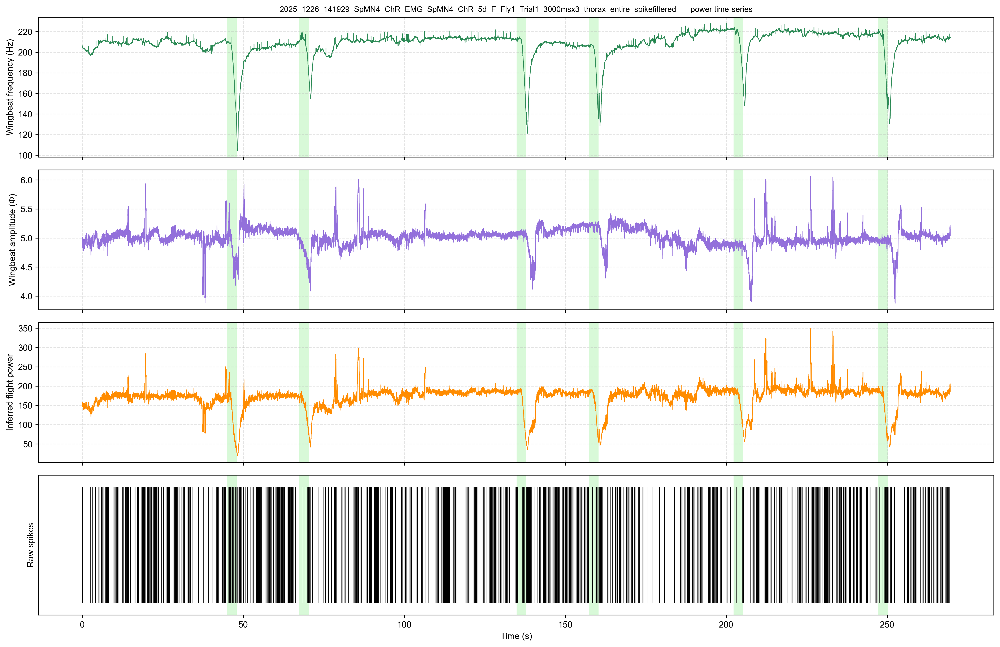

    saved 2025_1226_141929_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


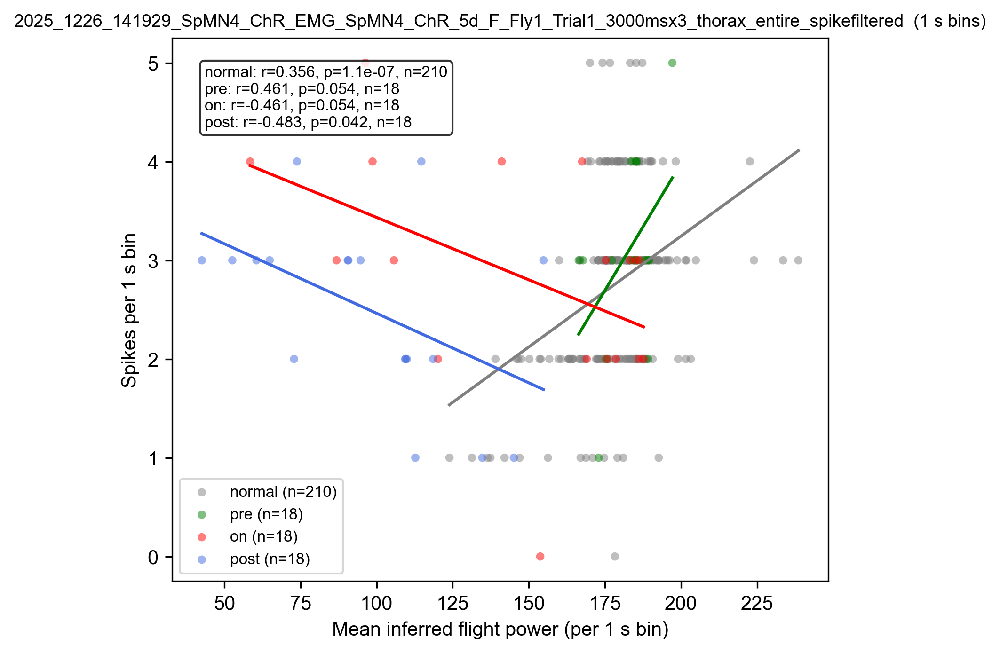

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2025_1226_Fly1/binned_1s_power_spikes.csv  (264 bins; pre=18, on=18, post=18, normal=210)

=== 2025_1226_Fly2 : 1 spikefiltered CSV(s) ===
[ok]   2025_1226_151425_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2025_1226_151425_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly2_Trial1_3000msx3_thorax.mat
         topcam <- 2025_1226_151425_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly2_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5396000)
    basler edges: 26965 | TopCamera frames: 27146 | matched: 26964
    spike t: [0.00, 269.80] s | basler edges t: [0.05, 269.79] s | coverage 100.0%
    saved 2025_1226_151425_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered_power

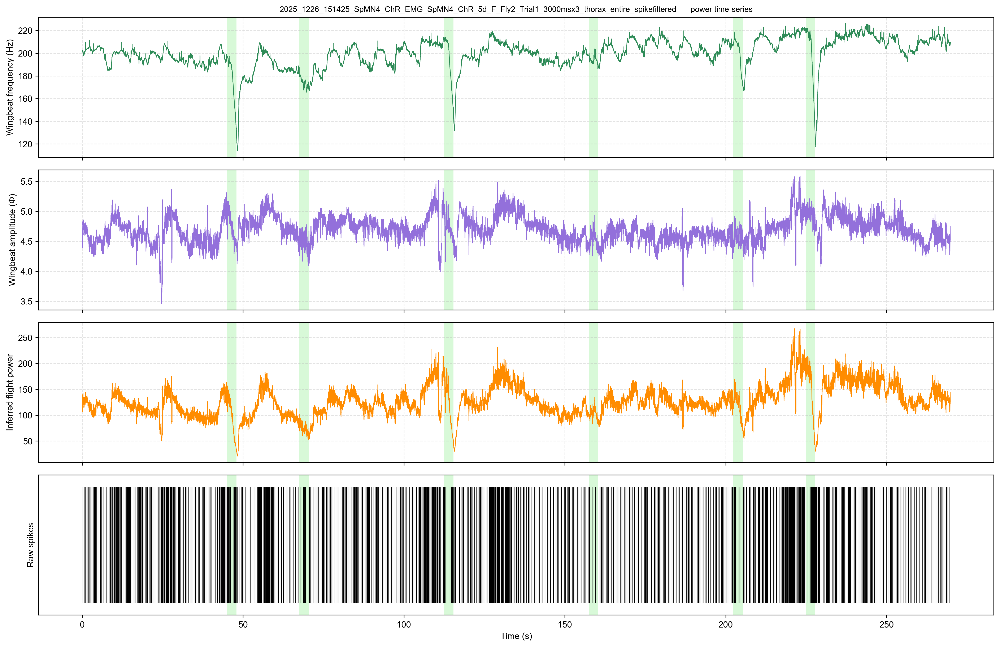

    saved 2025_1226_151425_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


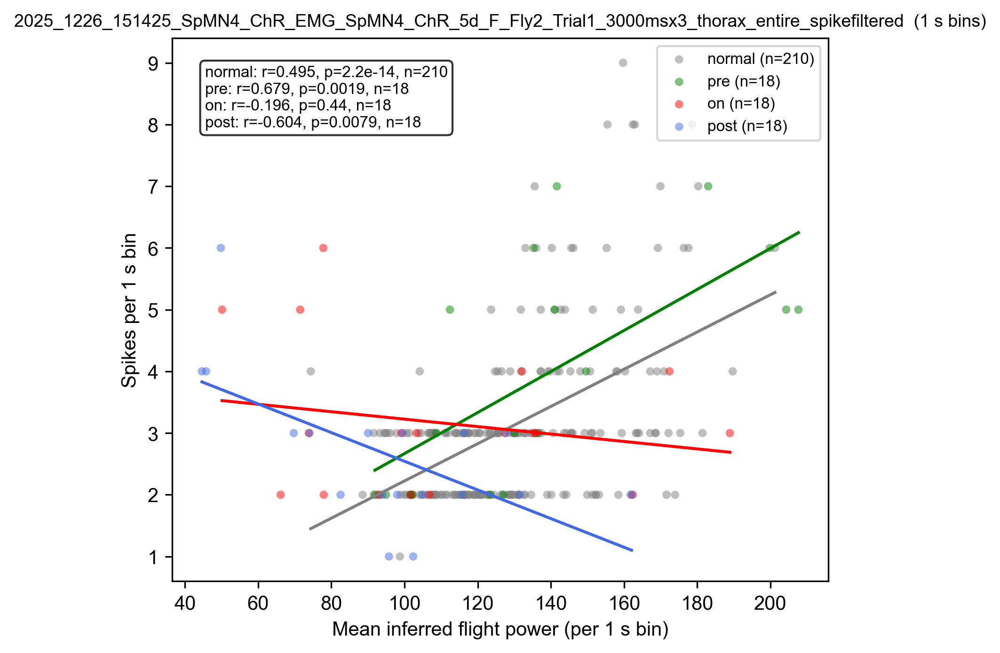

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2025_1226_Fly2/binned_1s_power_spikes.csv  (264 bins; pre=18, on=18, post=18, normal=210)

=== 2025_1226_Fly3 : 1 spikefiltered CSV(s) ===
[ok]   2025_1226_155640_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2025_1226_155640_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly3_Trial1_3000msx3_thorax.mat
         topcam <- 2025_1226_155640_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly3_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5392000)
    basler edges: 26945 | TopCamera frames: 27168 | matched: 26944
    spike t: [0.00, 269.60] s | basler edges t: [0.05, 269.59] s | coverage 100.0%
    saved 2025_1226_155640_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered_power

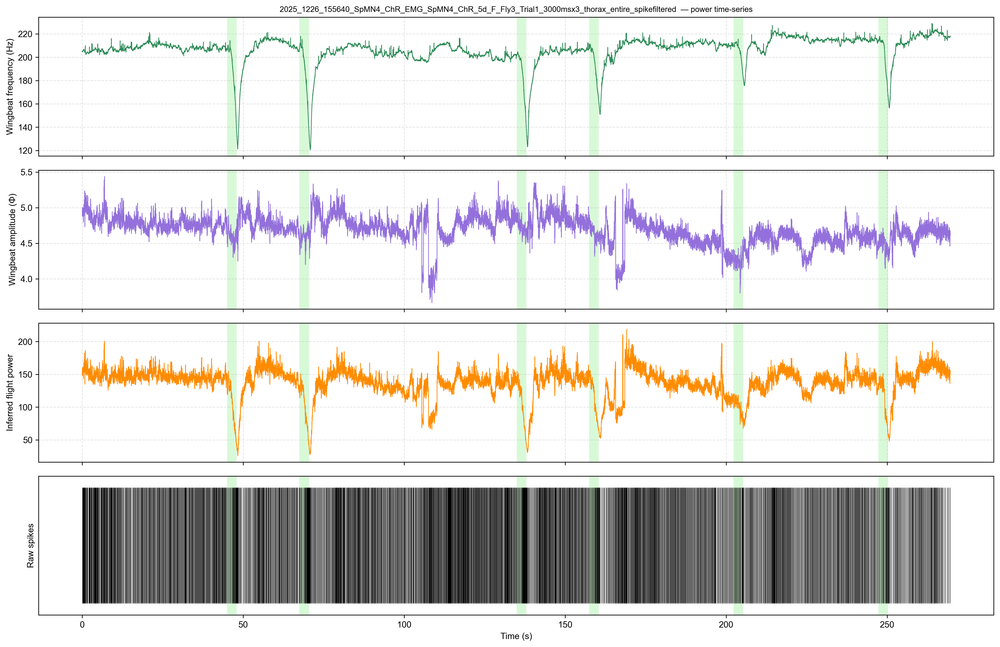

    saved 2025_1226_155640_SpMN4_ChR_EMG_SpMN4_ChR_5d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


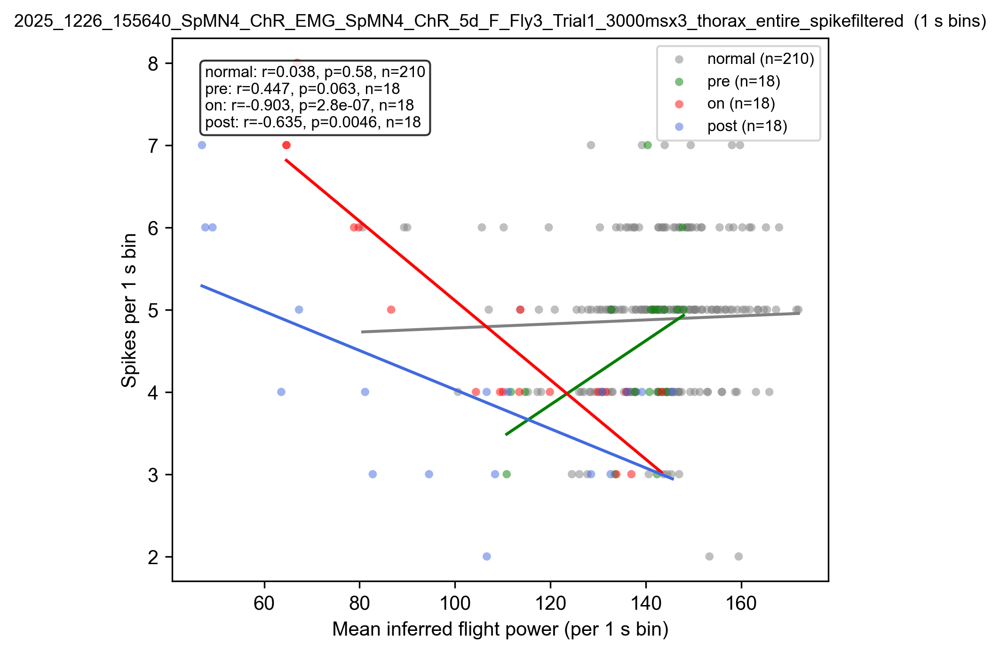

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2025_1226_Fly3/binned_1s_power_spikes.csv  (264 bins; pre=18, on=18, post=18, normal=210)

=== 2026_0510_Fly1 : 2 spikefiltered CSV(s) ===
[ok]   2026_0510_104108_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_104108_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial1_3000msx3_thorax.mat
         topcam <- 2026_0510_104108_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5393000)
    basler edges: 26950 | TopCamera frames: 27243 | matched: 26949
    spike t: [0.00, 269.65] s | basler edges t: [0.05, 269.64] s | coverage 100.0%
    saved 2026_0510_104108_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered_power_timeser

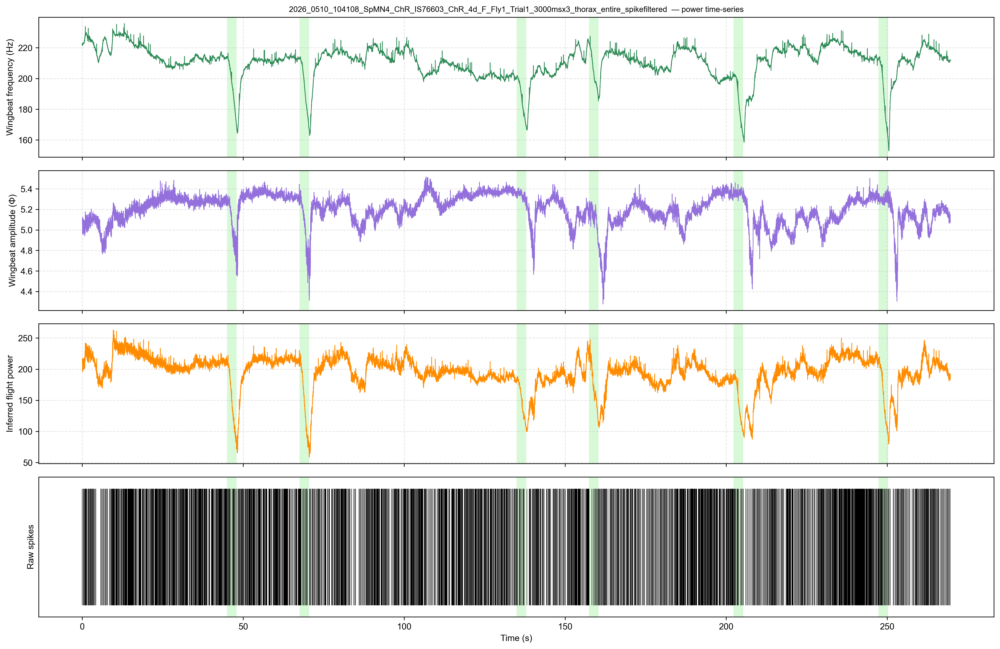

    saved 2026_0510_104108_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


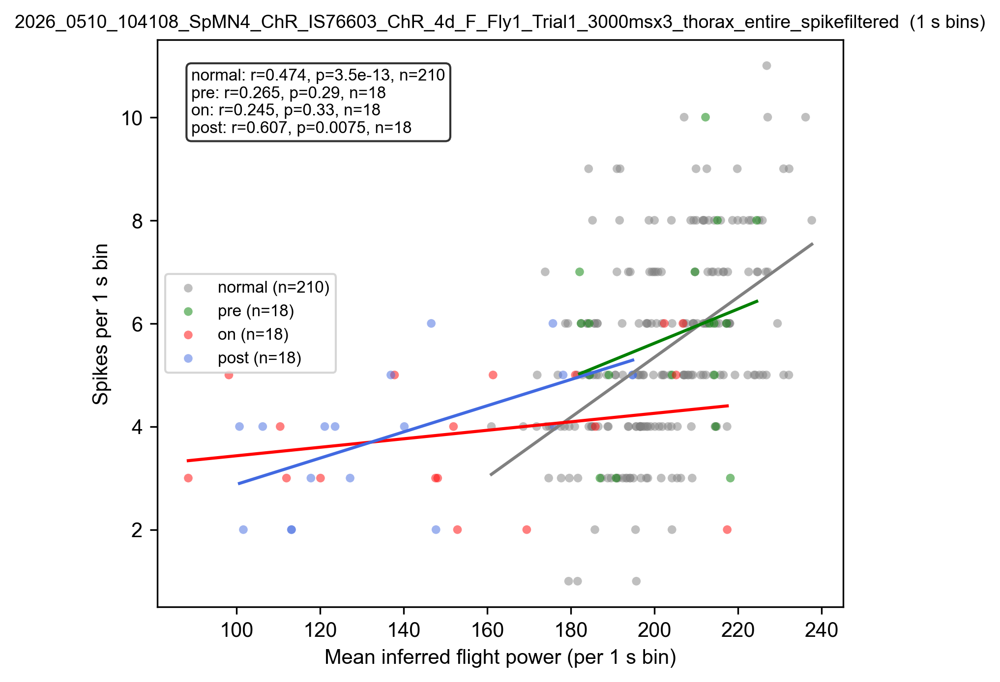

[ok]   2026_0510_105236_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial2_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_105236_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial2_3000msx3_thorax.mat
         topcam <- 2026_0510_105236_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial2_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5393000)
    basler edges: 26950 | TopCamera frames: 27132 | matched: 26949
    spike t: [0.00, 269.65] s | basler edges t: [0.05, 269.64] s | coverage 100.0%
    saved 2026_0510_105236_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial2_3000msx3_thorax_entire_spikefiltered_power_timeseries.svg


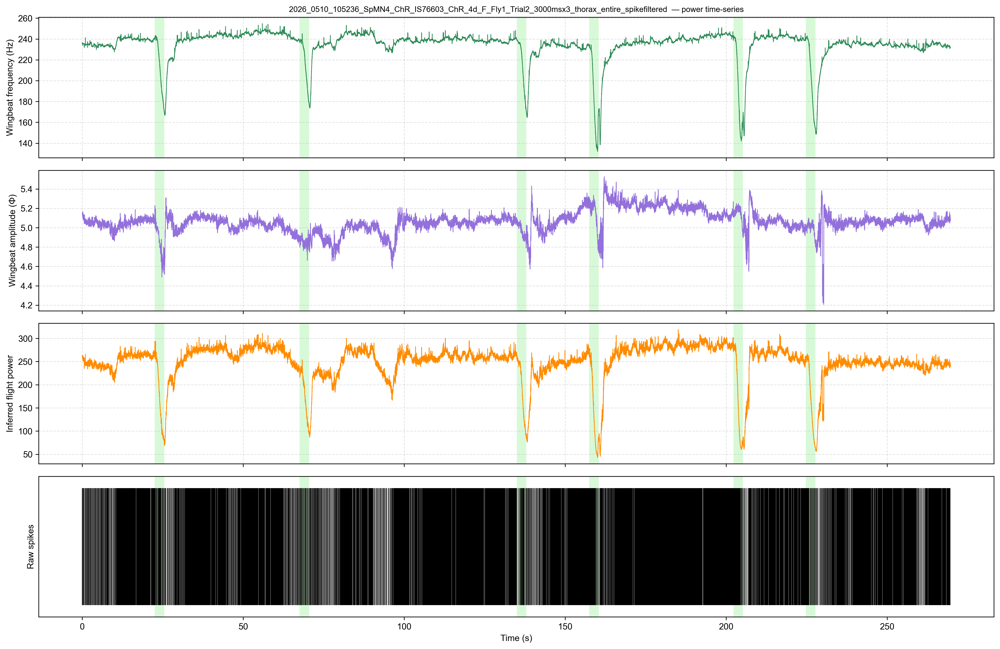

    saved 2026_0510_105236_SpMN4_ChR_IS76603_ChR_4d_F_Fly1_Trial2_3000msx3_thorax_entire_spikefiltered_power_corr.svg


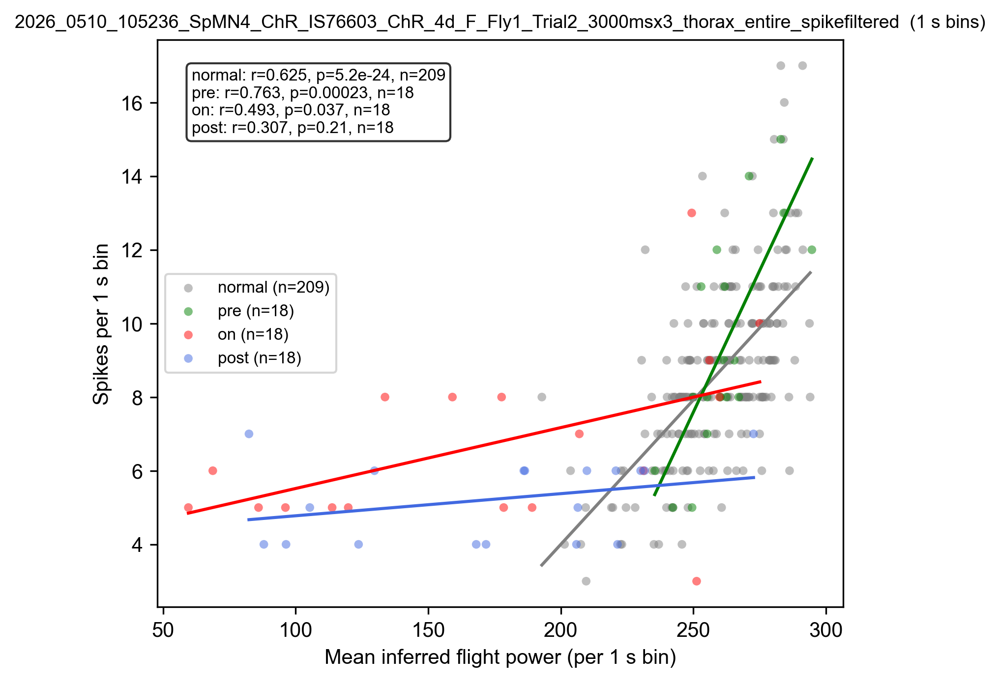

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2026_0510_Fly1/binned_1s_power_spikes.csv  (527 bins; pre=36, on=36, post=36, normal=419)

=== 2026_0510_Fly2 : 1 spikefiltered CSV(s) ===
[ok]   2026_0510_111508_SpMN4_ChR_IS76603_ChR_4d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_111508_SpMN4_ChR_IS76603_ChR_4d_F_Fly2_Trial1_3000msx3_thorax.mat
         topcam <- 2026_0510_111508_SpMN4_ChR_IS76603_ChR_4d_F_Fly2_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5395000)
    basler edges: 26960 | TopCamera frames: 27148 | matched: 26959
    spike t: [0.00, 269.75] s | basler edges t: [0.05, 269.74] s | coverage 100.0%
    saved 2026_0510_111508_SpMN4_ChR_IS76603_ChR_4d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered_power_timeser

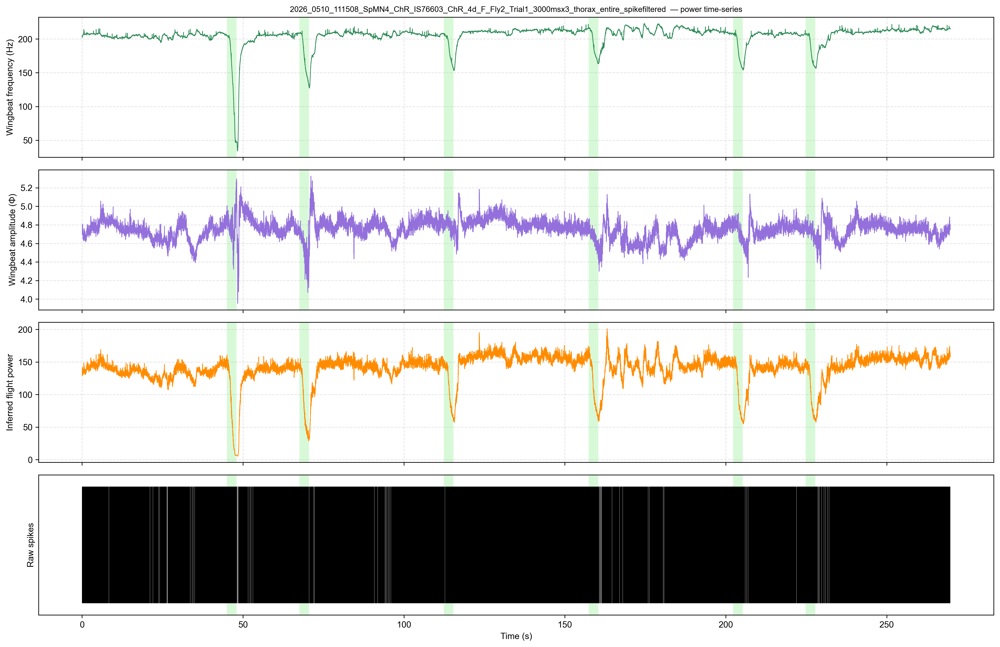

    saved 2026_0510_111508_SpMN4_ChR_IS76603_ChR_4d_F_Fly2_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


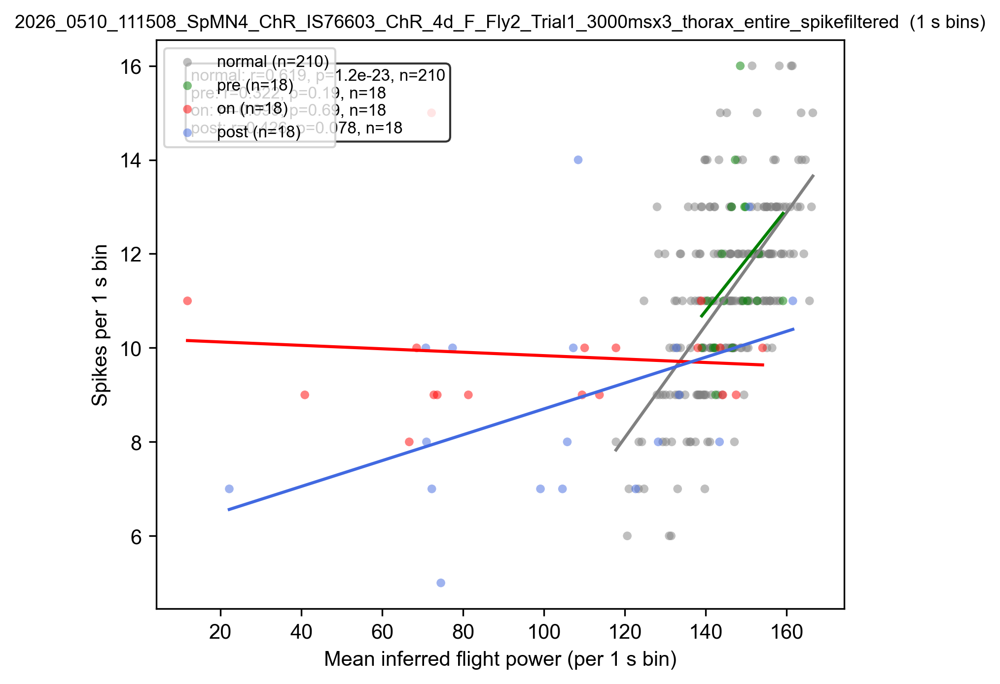

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2026_0510_Fly2/binned_1s_power_spikes.csv  (264 bins; pre=18, on=18, post=18, normal=210)

=== 2026_0510_Fly3 : 1 spikefiltered CSV(s) ===
[ok]   2026_0510_114225_SpMN4_ChR_IS76603_ChR_4d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_114225_SpMN4_ChR_IS76603_ChR_4d_F_Fly3_Trial1_3000msx3_thorax.mat
         topcam <- 2026_0510_114225_SpMN4_ChR_IS76603_ChR_4d_F_Fly3_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5396000)
    basler edges: 26965 | TopCamera frames: 27149 | matched: 26964
    spike t: [0.00, 269.80] s | basler edges t: [0.05, 269.79] s | coverage 100.0%
    saved 2026_0510_114225_SpMN4_ChR_IS76603_ChR_4d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered_power_timeser

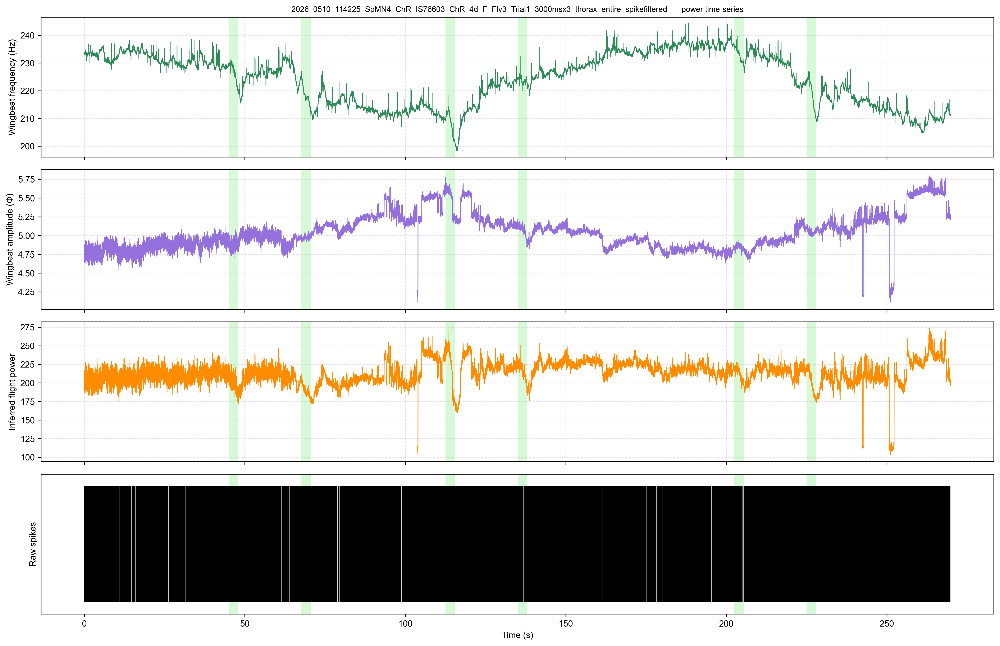

    saved 2026_0510_114225_SpMN4_ChR_IS76603_ChR_4d_F_Fly3_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


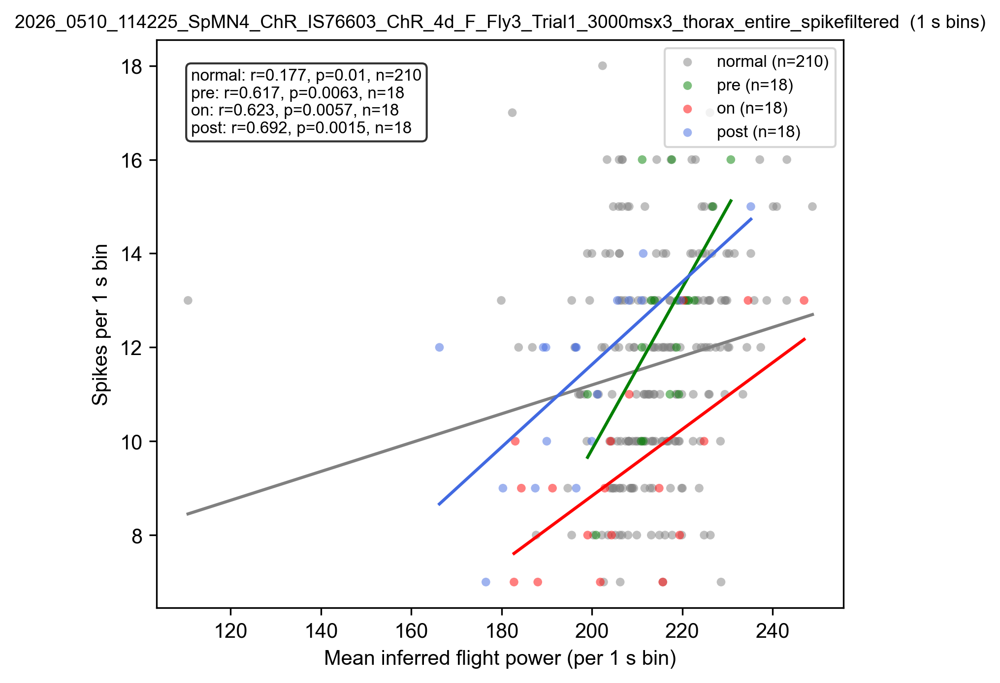

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2026_0510_Fly3/binned_1s_power_spikes.csv  (264 bins; pre=18, on=18, post=18, normal=210)

=== 2026_0510_Fly4 : 2 spikefiltered CSV(s) ===
[ok]   2026_0510_115701_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial1_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_115701_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial1_3000msx3_thorax.mat
         topcam <- 2026_0510_115701_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial1_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5393000)
    basler edges: 26950 | TopCamera frames: 27132 | matched: 26950
    spike t: [0.00, 269.65] s | basler edges t: [0.05, 269.64] s | coverage 100.0%
    saved 2026_0510_115701_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial1_3000msx3_thorax_entire_spikefiltered_power_timeser

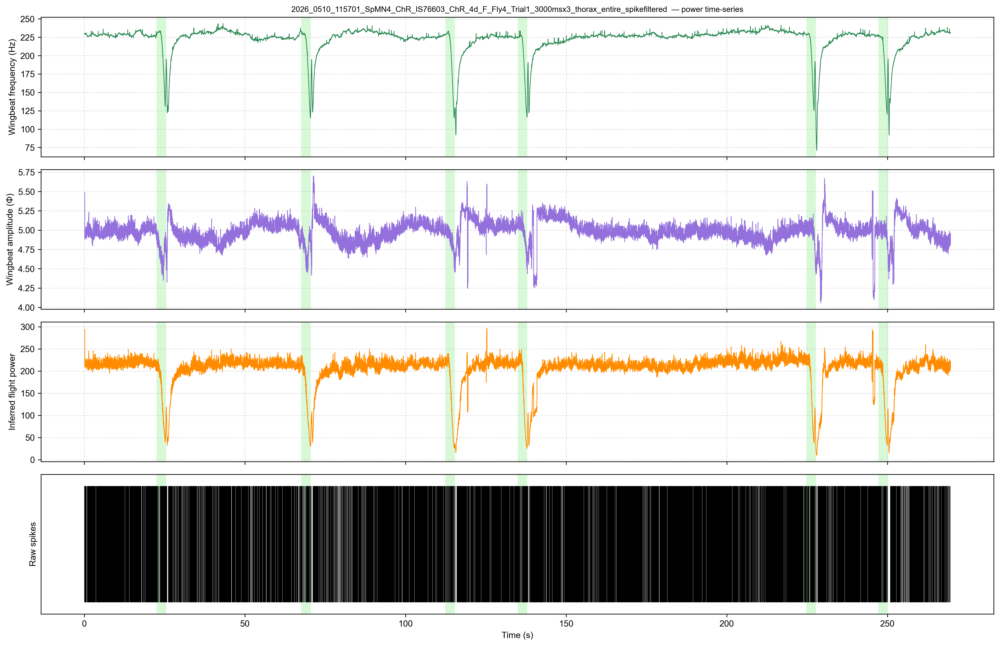

    saved 2026_0510_115701_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial1_3000msx3_thorax_entire_spikefiltered_power_corr.svg


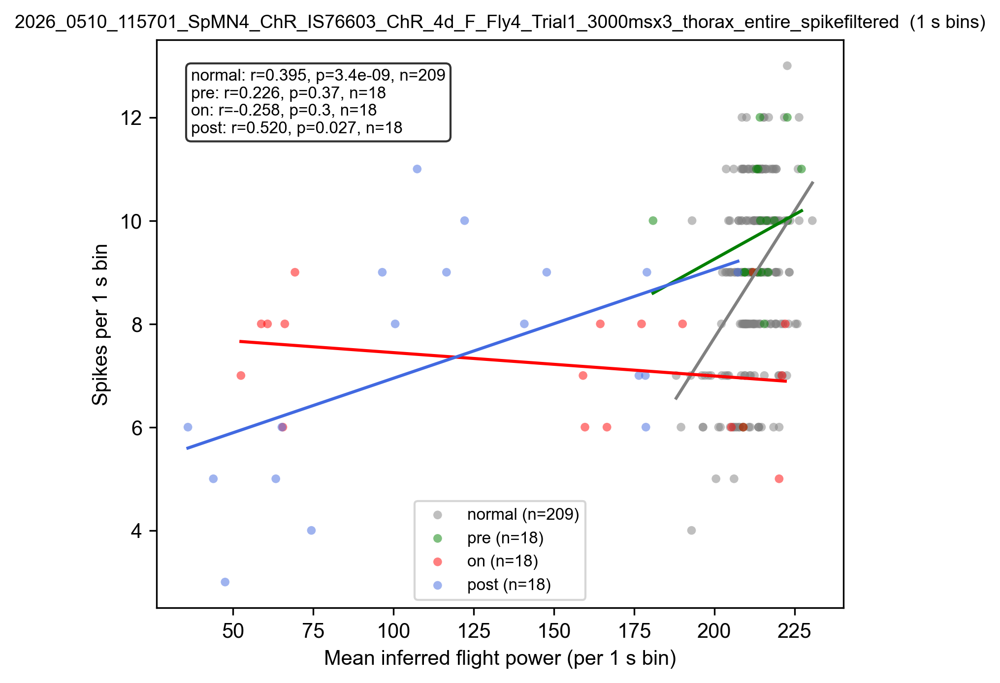

[ok]   2026_0510_120804_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial2_3000msx3_thorax_entire_spikefiltered
         mat  <- 2026_0510_120804_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial2_3000msx3_thorax.mat
         topcam <- 2026_0510_120804_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial2_3000msx3_thorax_TopCamera.csv
Loaded data shape: (9, 5397000)
    basler edges: 26970 | TopCamera frames: 27144 | matched: 26970
    spike t: [0.00, 269.85] s | basler edges t: [0.05, 269.84] s | coverage 100.0%
    saved 2026_0510_120804_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial2_3000msx3_thorax_entire_spikefiltered_power_timeseries.svg


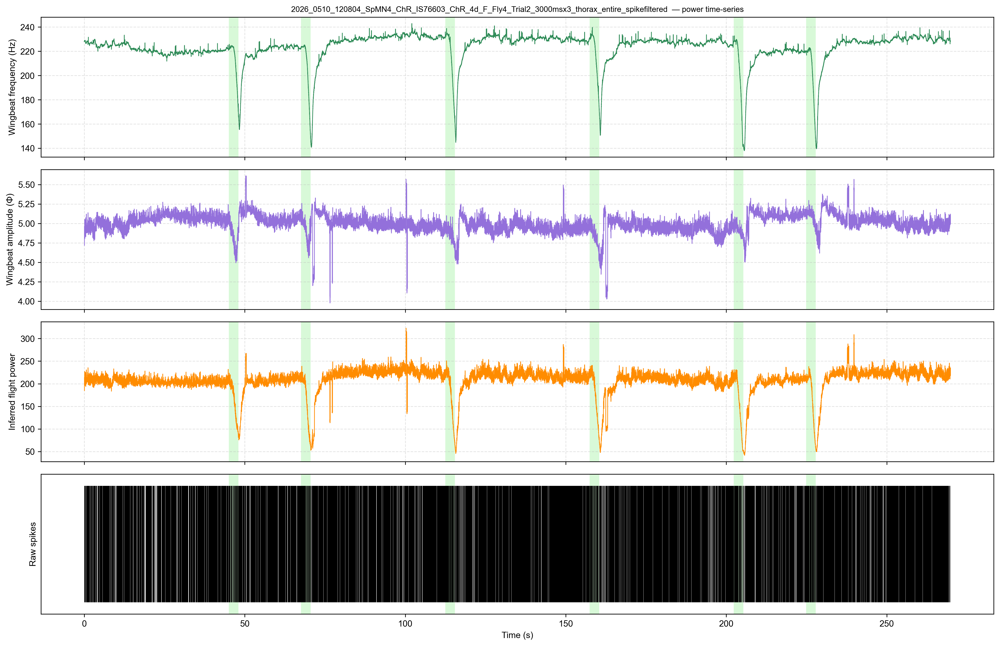

    saved 2026_0510_120804_SpMN4_ChR_IS76603_ChR_4d_F_Fly4_Trial2_3000msx3_thorax_entire_spikefiltered_power_corr.svg


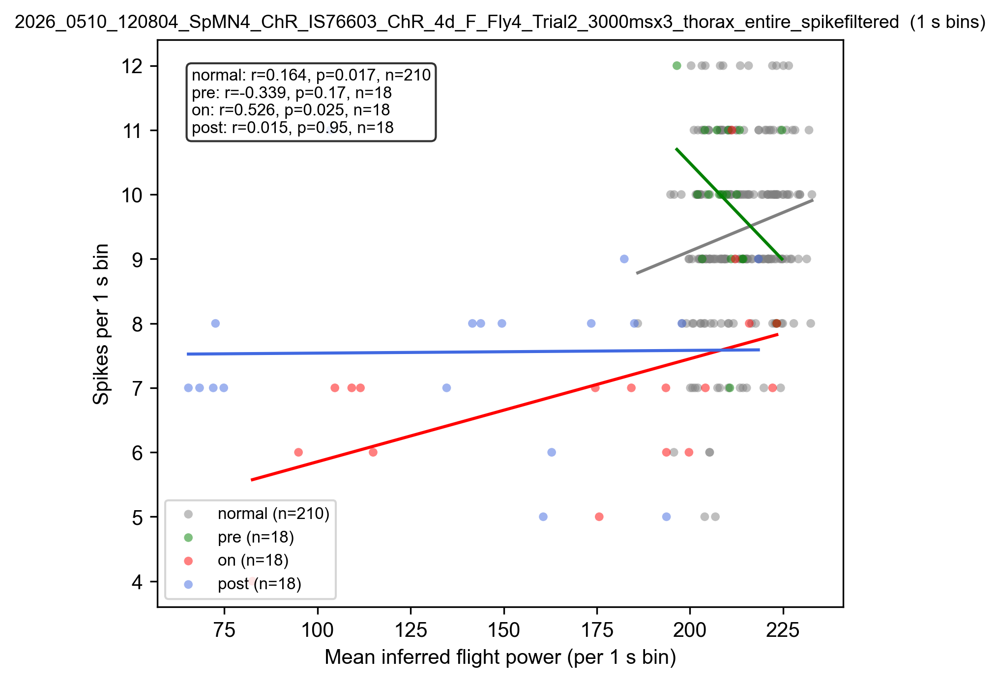

   saved /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/2026_0510_Fly4/binned_1s_power_spikes.csv  (527 bins; pre=36, on=36, post=36, normal=419)
    saved ALL_pooled_power_corr.svg


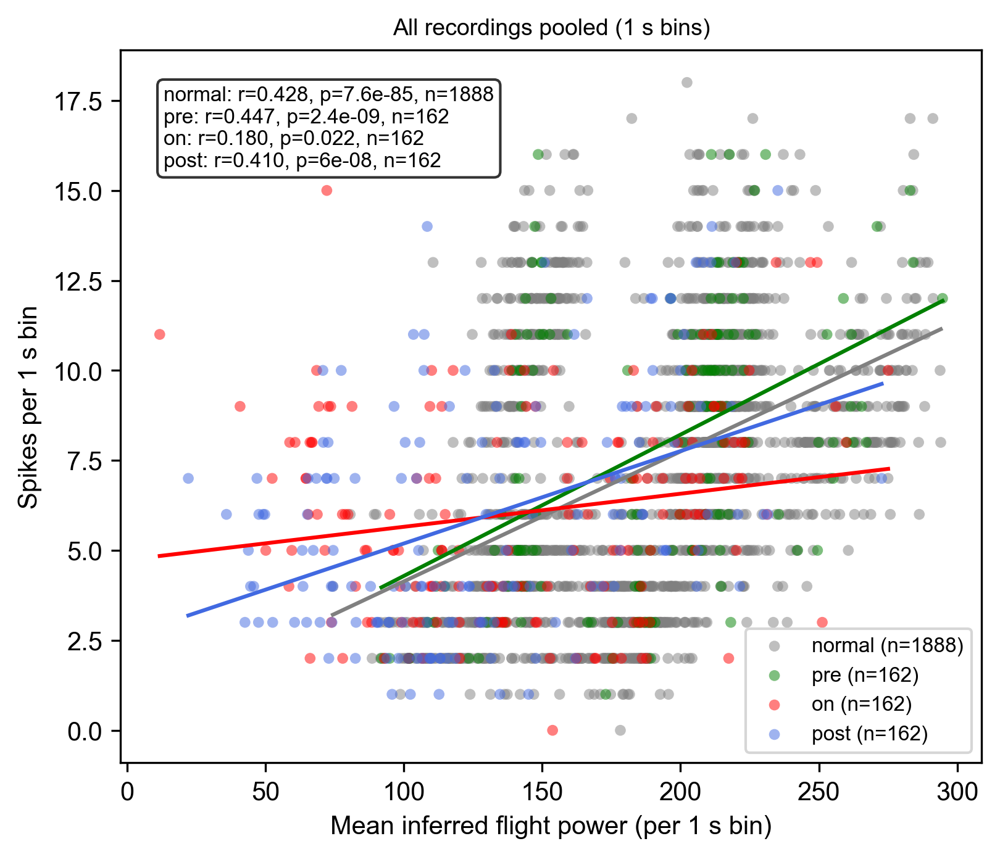

Pooled across all flies -> /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder/ALL_pooled_power_corr.svg


In [20]:
# Step 6 — inferred flight power vs spikes, 1 s bins, grouped by opto epoch
# Loads the .mat directly (basler TTL + WBF) + TopCamera CSV (amplitude); spikes/opto from Step 5 CSV.
# Groups: normal (off, grey) | pre = 3 bins before onset (green) | opto-ON (red) | post = 3 bins after offset (blue)
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

%run '/Users/camellyc/Library/Mobile Documents/com~apple~CloudDocs/学习/Lab/Tuthill Lab/Codes/Flight_Arena_Analysis/spiracle_helper_functions.py'
set_plot_style()

# ====== EDIT THESE ======
# MAIN folder containing the per-fly subfolders (named like xxxxxx_Flyx). Each fly subfolder holds
# its own *_spikefiltered.csv, .mat, and *_TopCamera.csv. The driver loops over every fly subfolder,
# writing that fly's binned_1s_power_spikes.csv beside its .mat and plots into <fly>/power_plots/.
corr_input_directory = '/Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder'
binned_root          = corr_input_directory   # Block 2 reads every fly's binned CSV from here

bin_seconds        = 1.0
n_post_bins        = 3       # post-opto bins after each stimulus offset
n_pre_bins         = 3       # prestimulus bins before each stimulus onset
sampling_rate      = 20000
onset_round_tol    = 0.05    # so a 2.999 s stim -> 3 ON bins (within ~50 ms rounds up)
off_tol            = 0.05    # a "normal" bin must be essentially fully opto-off
basler_time_offset = 0.0     # seconds; safety knob if the time-axis diagnostic shows a mismatch

# Basler TTL edge detection (identical to step1_phantom_video_analysis.ipynb, Block 5)
THRESHOLD  = 1.5             # V, basler TTL high
DEADTIME_S = 0.002          # debounce between accepted rising edges
PI_REF     = 3.1416         # added to LeftWing + RightWing (Step 1 convention)

# Step 1 inferred-power model
C_PRO     = 1.44e-7
C_IND     = 10.5
WBF_TO_HZ = 100.0           # .mat Data[3] (raw) * 100 -> Hz

GROUP_COLORS = {'normal': 'grey', 'pre': 'green', 'on': 'red', 'post': 'royalblue'}
# ========================


def interp_irregular(t, y, xq):
    """Piecewise-linear interpolation; drop invalid points in (t, y); NaN outside range.
    Copied verbatim from step1_phantom_video_analysis.ipynb (Block 6)."""
    t = np.asarray(t, float); y = np.asarray(y, float)
    m = np.isfinite(t) & np.isfinite(y)
    t = t[m]; y = y[m]
    if t.size == 0:
        return np.full(np.shape(xq), np.nan)
    order = np.argsort(t)
    t, y = t[order], y[order]
    uniq = np.concatenate([[True], np.diff(t) > 1e-15])
    t, y = t[uniq], y[uniq]
    if t.size < 2:
        return np.full(np.shape(xq), np.nan)
    return np.interp(xq, t, y, left=np.nan, right=np.nan)


def pair_inputs(spike_csv, mat_dir):
    """Find the .mat and *_TopCamera.csv matching a Step 5 spikefiltered CSV.
    Spike stem '<mat_base>_entire_spikefiltered' -> '<mat_base>.mat' + '<mat_base>*TopCamera*.csv'."""
    stem = os.path.splitext(os.path.basename(spike_csv))[0]
    mat_base = stem.replace('_entire_spikefiltered', '').replace('_spikefiltered', '')
    mats = glob.glob(os.path.join(mat_dir, f'{mat_base}.mat')) or \
           glob.glob(os.path.join(mat_dir, f'{mat_base}*.mat'))
    tops = [p for p in glob.glob(os.path.join(mat_dir, f'{mat_base}*.csv'))
            if 'topcamera' in os.path.basename(p).lower()]
    return (sorted(mats)[0] if mats else None,
            sorted(tops)[0] if tops else None)


def _topcam_amplitude(topcam_csv):
    """Read a TopCamera CSV -> (frame_numbers, amplitude=L+R+PI_REF). Column detection per Step 1."""
    df = pd.read_csv(topcam_csv)
    frame_col = next((c for c in df.columns if str(c).strip().lower() == 'frame'), None)
    if frame_col is None:
        frame_col = next((c for c in df.columns if 'frame' in str(c).lower()), df.columns[0])
    left_col  = next((c for c in df.columns if 'left'  in str(c).lower() and 'wing' in str(c).lower()), None)
    right_col = next((c for c in df.columns if 'right' in str(c).lower() and 'wing' in str(c).lower()), None)
    if left_col is None or right_col is None:
        raise ValueError(f'Cannot find LeftWing/RightWing columns in {os.path.basename(topcam_csv)}: '
                         f'{list(df.columns)}')
    frames = pd.to_numeric(df[frame_col], errors='coerce').values
    amp = (pd.to_numeric(df[left_col], errors='coerce').values
           + pd.to_numeric(df[right_col], errors='coerce').values + PI_REF)
    return frames, amp


def basler_amplitude_axis(mat_path, topcam_csv, fs):
    """Detect basler rising edges in the .mat (Data[8]) and assign each TopCamera frame that
    edge's time + amplitude. No phantom: frame k = k-th edge over the whole recording.
    Returns (basler_times, basler_amp, freq_hz_axis, time_axis)."""
    data = load_and_reshape_data(mat_path, sampling_rate=fs)   # 9 x N
    n = data.shape[1]
    time_axis = np.arange(n) / fs                              # matches Step 5 generate_time_axis
    basler_ttl = data[8]

    binary = (basler_ttl >= THRESHOLD).astype(np.int8)
    rise_idx = np.where(np.diff(binary, prepend=0) == 1)[0]
    if rise_idx.size:                                          # debounce (DEADTIME_S)
        dead = int(DEADTIME_S * fs)
        keep = [rise_idx[0]]
        for i in rise_idx[1:]:
            if i - keep[-1] >= dead:
                keep.append(i)
        rise_idx = np.array(keep)
    basler_times = time_axis[rise_idx]
    global_frames = np.arange(1, basler_times.size + 1, dtype=int)

    frames, amp = _topcam_amplitude(topcam_csv)
    frame_to_amp = {float(f): float(w) for f, w in zip(frames, amp)
                    if np.isfinite(f) and np.isfinite(w)}
    basler_amp = np.array([frame_to_amp.get(float(k), np.nan) for k in global_frames], float)

    freq_hz_axis = data[3].astype(float) * WBF_TO_HZ
    print(f'    basler edges: {basler_times.size} | TopCamera frames: {frames.size} '
          f'| matched: {np.sum(np.isfinite(basler_amp))}')
    return basler_times, basler_amp, freq_hz_axis, time_axis


def compute_power_axis(spike_df, mat_path, topcam_csv, fs):
    """Inferred power on the spike CSV's 20 kHz axis:
    power = C_PRO*phi^3*n^3 + C_IND*phi^-0.5 (NaN where phi<=0 or n<=0)."""
    t = spike_df['Time (s)'].to_numpy(float)
    basler_times, basler_amp, freq_hz_axis, time_axis = basler_amplitude_axis(mat_path, topcam_csv, fs)

    phi  = interp_irregular(basler_times + basler_time_offset, basler_amp, t)
    n_hz = interp_irregular(time_axis, freq_hz_axis, t)

    power = np.full_like(t, np.nan, dtype=float)
    ok = np.isfinite(phi) & np.isfinite(n_hz) & (phi > 0) & (n_hz > 0)
    power[ok] = C_PRO * phi[ok] ** 3 * n_hz[ok] ** 3 + C_IND * phi[ok] ** (-0.5)

    cover = np.mean((t >= np.nanmin(basler_times)) & (t <= np.nanmax(basler_times))) if basler_times.size else 0.0
    print(f'    spike t: [{t[0]:.2f}, {t[-1]:.2f}] s | basler edges t: '
          f'[{np.nanmin(basler_times):.2f}, {np.nanmax(basler_times):.2f}] s | coverage {100*cover:.1f}%'
          + ('   <-- low overlap, check basler_time_offset' if cover < 0.5 else ''))
    return n_hz, phi, power


def _opto_spans(time, opto):
    opto = (np.asarray(opto) > 0).astype(int)
    d = np.diff(opto, prepend=0, append=0)
    s = np.where(d == 1)[0]; e = np.where(d == -1)[0]
    return [(time[a], time[min(b, len(time) - 1)]) for a, b in zip(s, e)]


def _downsample(x, y, max_pts=300000):
    if len(x) <= max_pts:
        return x, y
    step = len(x) // max_pts
    return x[::step], y[::step]


def plot_power_timeseries(t, freq, amp, power, opto, title, out_svg=None, spike_count=None):
    """Stacked panels over the whole recording: frequency (Hz), amplitude, inferred power,
    and (optionally) raw spikes as a raster; opto shading on each."""
    spans = _opto_spans(t, opto)
    n_panels = 4 if spike_count is not None else 3
    fig, axes = plt.subplots(n_panels, 1, figsize=(16, 2.6 * n_panels), sharex=True)
    series = [(freq, 'Wingbeat frequency (Hz)', 'seagreen'),
              (amp, 'Wingbeat amplitude (Φ)', 'mediumpurple'),
              (power, 'Inferred flight power', 'darkorange')]
    for ax, (y, ylab, col) in zip(axes, series):
        xx, yy = _downsample(t, y)
        ax.plot(xx, yy, color=col, linewidth=0.8)
        ax.set_ylabel(ylab, fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.35)
        for (ws, we) in spans:
            ax.axvspan(ws, we, color='lightgreen', alpha=0.35, linewidth=0)
    if spike_count is not None:
        ax = axes[3]
        spk_t = np.asarray(t, float)[np.asarray(spike_count) == 1]
        ax.vlines(spk_t, 0, 1, color='black', linewidth=0.5)
        ax.set_ylabel('Raw spikes', fontsize=10)
        ax.set_yticks([]); ax.set_ylim(-0.1, 1.1)
        for (ws, we) in spans:
            ax.axvspan(ws, we, color='lightgreen', alpha=0.35, linewidth=0)
    axes[-1].set_xlabel('Time (s)')
    axes[0].set_title(title, fontsize=9)
    plt.tight_layout()
    if out_svg:
        os.makedirs(os.path.dirname(out_svg), exist_ok=True)
        fig.savefig(out_svg, format='svg', bbox_inches='tight')
        print('    saved', os.path.basename(out_svg))
    plt.show()


def bin_power_by_opto(spike_df, power, csv_name, bin_seconds=1.0, n_post=3, n_pre=3,
                      onset_round_tol=0.05, off_tol=0.05, sampling_rate=20000):
    """Bin into 1 s bins grouped by opto epoch (normal/pre/on/post) — identical window logic to
    Step 5 Block 5's bin_by_opto — returning mean power and spike count per bin.
    PRE = n_pre bins immediately before each onset (skip those overlapping any ON/POST window);
    ON bins referenced to each onset (tolerant so a 2.999 s stim -> 3 ON bins); POST = n_post bins
    after each offset (skip those overlapping a later ON window); NORMAL = complete, fully-off bins
    outside PRE/ON/POST."""
    df = spike_df
    t = df['Time (s)'].to_numpy(float)
    opto = (df['Opto Stimulus'].to_numpy() > 0).astype(int)
    spk_t = t[df['Spike Count'].to_numpy() == 1]
    pwr = np.asarray(power, float)

    dd = np.diff(opto, prepend=0, append=0)
    on_idx = np.where(dd == 1)[0]; off_idx = np.where(dd == -1)[0]
    dt = 1.0 / sampling_rate
    blocks = []
    for s, e in zip(on_idx, off_idx):
        t_on  = t[s]
        t_off = t[e] if e < len(t) else t[-1] + dt
        n_on  = max(int(np.floor((t_off - t_on) / bin_seconds + onset_round_tol)), 1)
        on_end = t_on + n_on * bin_seconds
        blocks.append({'t_on': t_on, 'n_on': n_on, 'post_start': on_end})
    on_windows   = [(b['t_on'], b['t_on'] + b['n_on'] * bin_seconds) for b in blocks]
    post_windows = [(b['post_start'], b['post_start'] + n_post * bin_seconds) for b in blocks]
    pre_windows  = [(b['t_on'] - n_pre * bin_seconds, b['t_on']) for b in blocks]

    def _ovl(b0, b1, wins):
        return any(b0 < we and b1 > ws for (ws, we) in wins)

    def _metrics(b0, b1):
        i0 = np.searchsorted(t, b0, 'left'); i1 = np.searchsorted(t, b1, 'left')
        if i1 <= i0:
            return None
        mean_pwr = np.nanmean(pwr[i0:i1])
        spikes = int(np.count_nonzero((spk_t >= b0) & (spk_t < b1)))
        return mean_pwr, spikes

    rows = []
    for b in blocks:                                    # PRE bins (before onset)
        for k in range(n_pre):
            b0 = b['t_on'] - (n_pre - k) * bin_seconds; b1 = b0 + bin_seconds
            if _ovl(b0, b1, on_windows + post_windows):
                continue
            m = _metrics(b0, b1)
            if m: rows.append((b0, 'pre', m[0], m[1]))
    for b in blocks:                                    # ON bins (from onset)
        for k in range(b['n_on']):
            b0 = b['t_on'] + k * bin_seconds
            m = _metrics(b0, b0 + bin_seconds)
            if m: rows.append((b0, 'on', m[0], m[1]))
    for (ps, pe) in post_windows:                       # POST bins (from offset)
        for k in range(n_post):
            b0 = ps + k * bin_seconds; b1 = b0 + bin_seconds
            if _ovl(b0, b1, on_windows):
                continue
            m = _metrics(b0, b1)
            if m: rows.append((b0, 'post', m[0], m[1]))
    claimed = on_windows + post_windows + pre_windows   # NORMAL bins (absolute grid, fully off)
    full = bin_seconds * sampling_rate
    edges = np.arange(np.floor(t[0] / bin_seconds) * bin_seconds, t[-1], bin_seconds)
    for b0 in edges:
        b1 = b0 + bin_seconds
        i0 = np.searchsorted(t, b0, 'left'); i1 = np.searchsorted(t, b1, 'left')
        if (i1 - i0) < full * 0.999:
            continue
        if np.mean(opto[i0:i1]) > off_tol:
            continue
        if _ovl(b0, b1, claimed):
            continue
        m = _metrics(b0, b1)
        if m: rows.append((b0, 'normal', m[0], m[1]))

    out = pd.DataFrame(rows, columns=['t_start', 'group', 'mean_power', 'spike_count'])
    out['source_file'] = csv_name
    return out.sort_values('t_start').reset_index(drop=True)


def scatter_power(bdf, title, out_svg=None):
    """Spikes per 1 s bin (y) vs mean inferred power (x), by opto group, with per-group linear
    fit + Pearson r. Clone of Step 5 Block 5's scatter_corr with x=power, y=spike_count."""
    fig, ax = plt.subplots(figsize=(6, 5))
    info = []
    for grp in ['normal', 'pre', 'on', 'post']:
        sub = bdf[bdf['group'] == grp]
        if sub.empty:
            continue
        x = sub['mean_power'].to_numpy(); y = sub['spike_count'].to_numpy()
        ax.scatter(x, y, c=GROUP_COLORS[grp], alpha=0.5, s=18, edgecolors='none',
                   label=f'{grp} (n={len(sub)})')
        ok = np.isfinite(x) & np.isfinite(y)
        if ok.sum() >= 3 and np.nanstd(x[ok]) > 0:
            sl, ic, r, p, se = stats.linregress(x[ok], y[ok])
            xx = np.linspace(np.nanmin(x[ok]), np.nanmax(x[ok]), 100)
            ax.plot(xx, sl * xx + ic, color=GROUP_COLORS[grp], lw=1.5)
            info.append(f'{grp}: r={r:.3f}, p={p:.2g}, n={int(ok.sum())}')
    ax.set_xlabel('Mean inferred flight power (per 1 s bin)')
    ax.set_ylabel('Spikes per 1 s bin')
    ax.set_title(title, fontsize=9)
    ax.legend(loc='best', fontsize=8)
    if info:
        ax.text(0.05, 0.95, '\n'.join(info), transform=ax.transAxes, va='top',
                fontsize=8, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    if out_svg:
        os.makedirs(os.path.dirname(out_svg), exist_ok=True)
        fig.savefig(out_svg, format='svg', bbox_inches='tight')
        print('    saved', os.path.basename(out_svg))
    plt.show()


# ===================== driver =====================
def process_fly_folder(fly_dir):
    """Process one fly folder (spikefiltered CSVs + .mat + *_TopCamera.csv all live here).
    Saves per-recording SVGs + that folder's binned_1s_power_spikes.csv. Returns combined frame."""
    csvs = sorted(glob.glob(os.path.join(fly_dir, '*_spikefiltered.csv')))
    if not csvs:
        return pd.DataFrame()
    print(f'\n=== {os.path.basename(fly_dir)} : {len(csvs)} spikefiltered CSV(s) ===')
    plot_dir = os.path.join(fly_dir, 'power_plots')
    all_bins = []
    for csv_path in csvs:
        stem = os.path.splitext(os.path.basename(csv_path))[0]
        mat_path, topcam_csv = pair_inputs(csv_path, fly_dir)   # mat + topcam live in the fly folder
        if mat_path is None or topcam_csv is None:
            print(f'[skip] {stem}: missing '
                  + ('mat ' if mat_path is None else '') + ('TopCamera ' if topcam_csv is None else '')
                  + f'in {fly_dir}')
            continue
        print(f'[ok]   {stem}\n         mat  <- {os.path.basename(mat_path)}'
              f'\n         topcam <- {os.path.basename(topcam_csv)}')

        spike_df = pd.read_csv(csv_path).dropna(subset=['Time (s)'])
        freq, amp, power = compute_power_axis(spike_df, mat_path, topcam_csv, sampling_rate)

        plot_power_timeseries(spike_df['Time (s)'].to_numpy(float), freq, amp, power,
                              spike_df['Opto Stimulus'].to_numpy(), f'{stem}  — power time-series',
                              out_svg=os.path.join(plot_dir, f'{stem}_power_timeseries.svg'),
                              spike_count=spike_df['Spike Count'].to_numpy())

        b = bin_power_by_opto(spike_df, power, os.path.basename(csv_path),
                              bin_seconds, n_post_bins, n_pre_bins, onset_round_tol, off_tol, sampling_rate)
        all_bins.append(b)
        scatter_power(b, f'{stem}  (1 s bins)', out_svg=os.path.join(plot_dir, f'{stem}_power_corr.svg'))

    if not all_bins:
        return pd.DataFrame()
    combined = pd.concat(all_bins, ignore_index=True)
    out_csv = os.path.join(fly_dir, 'binned_1s_power_spikes.csv')
    combined.to_csv(out_csv, index=False)
    print(f'   saved {out_csv}  ({len(combined)} bins; '
          f'pre={int((combined["group"] == "pre").sum())}, on={int((combined["group"] == "on").sum())}, '
          f'post={int((combined["group"] == "post").sum())}, normal={int((combined["group"] == "normal").sum())})')
    return combined


# Loop over every fly subfolder under corr_input_directory (those containing spikefiltered CSVs).
fly_dirs = sorted(d for d in glob.glob(os.path.join(corr_input_directory, '*'))
                  if os.path.isdir(d) and glob.glob(os.path.join(d, '*_spikefiltered.csv')))
print(f'Found {len(fly_dirs)} fly folder(s) under {corr_input_directory}')

all_fly_bins = []
for fly_dir in fly_dirs:
    fb = process_fly_folder(fly_dir)
    if not fb.empty:
        all_fly_bins.append(fb)

pooled = pd.concat(all_fly_bins, ignore_index=True) if all_fly_bins else pd.DataFrame()
if not pooled.empty:
    scatter_power(pooled, 'All recordings pooled (1 s bins)',
                  out_svg=os.path.join(corr_input_directory, 'ALL_pooled_power_corr.svg'))
    print('Pooled across all flies ->', os.path.join(corr_input_directory, 'ALL_pooled_power_corr.svg'))
else:
    print('No bins produced.')


## Block 2 — Per-fly power residual vs rest baseline (pre / during / after)

For each fly, fit the **rest baseline** as a straight line `lm(power ~ rate)` on the `normal` (opto-off) 1 s bins. Then for every `pre` / `on` / `post` bin compute the **residual** = observed power − baseline-predicted power at that bin's spike rate, and average the residuals → **one number per fly per condition**. Negative = flight power *below* the rest baseline at a matched firing rate.

Conditions are compared with a **paired Wilcoxon signed-rank test** on the per-fly residuals (Pre vs During, Pre vs After, During vs After; *n* = flies with both values); a one-sample Wilcoxon vs 0 per condition is also reported. The figure shows one dot per fly per column with each fly's dots **connected**, a line at zero, and the group **mean ± SEM**; pre = green, during = red, after = blue. Reads every `binned_1s_power_spikes.csv` under `binned_root` (re-run Block 1 first so they include the `pre` group).

**Block 2 —— 各果蝇相对静息基线的功率残差（pre / during / after）**

对每只果蝇，用 `normal`（光关闭）的 1 秒箱拟合**静息基线**直线 `lm(power ~ rate)`。然后对每个 `pre` / `on` / `post` 箱计算**残差** = 实测功率 − 在该箱发放率处基线预测的功率，并对残差求平均 → **每只果蝇每个条件一个数值**。负值表示在相同发放率下飞行功率*低于*静息基线。

各条件间用对每蝇残差的**配对 Wilcoxon 符号秩检验**比较（Pre vs During、Pre vs After、During vs After；*n* = 两个值都存在的果蝇数）；同时报告每个条件对 0 的单样本 Wilcoxon。图中每蝇每列一个点，每蝇的点之间**相连**，零处有一条线，并显示组**均值 ± SEM**；pre = 绿、during = 红、after = 蓝。读取 `binned_root` 下的每个 `binned_1s_power_spikes.csv`（请先重跑 Block 1，使其包含 `pre` 组）。

Found 7 per-fly binned CSV(s) under /Users/camellyc/Library/CloudStorage/GoogleDrive-yichen@tuthill.casa/.shortcut-targets-by-id/10pxdlRXtzFB-abwDGi0jOGOFFNm3pmFK/Tuthill Lab Shared/Yichen/Spiracle/Flight_Arena_Data/EMG_Analysis/4_SpMN4_ChR/SpMN4_ChR_EMG_spike_power_analysis/untitled folder

Per-fly mean flight power deficit (observed power - baseline-predicted, at matched rate):
           fly       Pre     During      After  n_normal  n_Pre  n_During  n_After
2025_1226_Fly1  2.065155 -31.914614 -80.183237       210     18        18       18
2025_1226_Fly2  1.686440 -20.645085 -31.666119       210     18        18       18
2025_1226_Fly3 -5.139369 -35.257559 -42.904918       210     18        18       18
2026_0510_Fly1 -2.735924 -50.202975 -50.387025       419     36        36       36
2026_0510_Fly2  0.255658 -41.041051 -33.333851       210     18        18       18
2026_0510_Fly3  0.942515  -4.621571 -15.946415       210     18        18       18
2026_0510_Fly4 -1.802659 -51.149619 

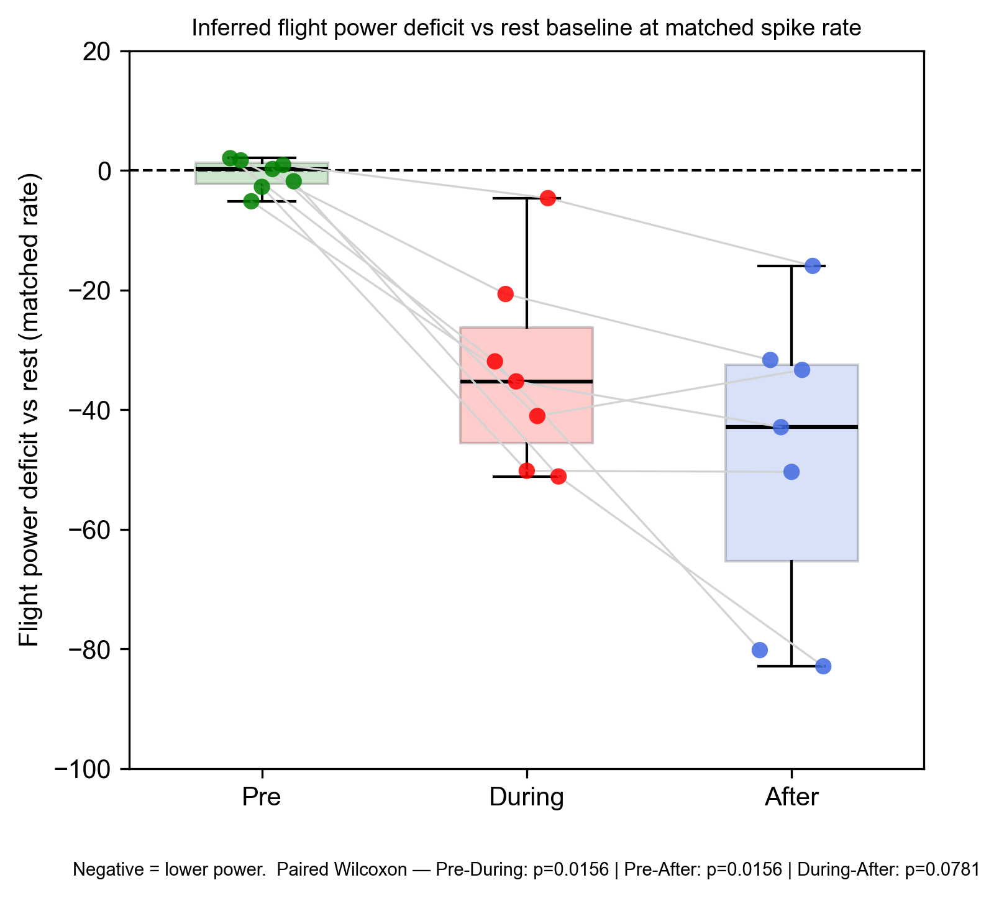

In [21]:
# Block 2 — per-fly flight power deficit vs rest baseline (pre / during / after), paired Wilcoxon
# Per fly: fit rest baseline lm(power ~ rate) on 'normal' bins; for each pre/on/post bin
# deficit = observed power - baseline-predicted power at that bin's rate; mean -> one number per
# fly per condition. Negative = power below rest baseline at matched rate. Paired Wilcoxon
# signed-rank between conditions (n = flies with both values); also one-sample vs 0 per condition.
import os, glob
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

set_plot_style()

# stored group label -> display column ; plus its dot color
COND = [('pre', 'Pre'), ('on', 'During'), ('post', 'After')]
COND_COLOR = {'Pre': 'green', 'During': 'red', 'After': 'royalblue'}

csv_paths = sorted(glob.glob(os.path.join(binned_root, '**', 'binned_1s_power_spikes.csv'),
                             recursive=True))
print(f'Found {len(csv_paths)} per-fly binned CSV(s) under {binned_root}')

rows = []
for p in csv_paths:
    fly = os.path.basename(os.path.dirname(p))           # one CSV = one fly (folder name)
    df = pd.read_csv(p)

    # rest baseline: straight line  power ~ rate  on the 'normal' (opto-off) bins
    base = df[df['group'] == 'normal']
    rate0 = pd.to_numeric(base['spike_count'], errors='coerce').to_numpy(float)
    pwr0  = pd.to_numeric(base['mean_power'],  errors='coerce').to_numpy(float)
    ok = np.isfinite(rate0) & np.isfinite(pwr0)
    if ok.sum() < 2 or np.std(rate0[ok]) == 0:
        print(f'[skip] {fly}: insufficient/zero-variance rest baseline (n_normal={int(ok.sum())})')
        continue
    slope, intercept, *_ = stats.linregress(rate0[ok], pwr0[ok])

    rec = {'fly': fly, 'slope': slope, 'intercept': intercept, 'n_normal': int(ok.sum())}
    for grp, label in COND:                              # deficit = observed - baseline-predicted
        sub = df[df['group'] == grp]
        r = pd.to_numeric(sub['spike_count'], errors='coerce').to_numpy(float)
        y = pd.to_numeric(sub['mean_power'],  errors='coerce').to_numpy(float)
        m = np.isfinite(r) & np.isfinite(y)
        deficit = y[m] - (slope * r[m] + intercept)
        rec[label] = float(np.mean(deficit)) if deficit.size else np.nan
        rec[f'n_{label}'] = int(m.sum())
    rows.append(rec)

per_fly = pd.DataFrame(rows)
out_csv = os.path.join(binned_root, 'power_deficit_per_fly.csv')
per_fly.to_csv(out_csv, index=False)
print('\nPer-fly mean flight power deficit (observed power - baseline-predicted, at matched rate):')
print(per_fly[['fly', 'Pre', 'During', 'After', 'n_normal', 'n_Pre', 'n_During', 'n_After']]
      .to_string(index=False))
print('Saved ->', out_csv)

# ---- One-sample Wilcoxon vs 0 (is each condition below the rest baseline?) ----
print('\nOne-sample Wilcoxon signed-rank vs 0  (negative = power below rest baseline at matched rate):')
onesamp = {}
for grp, label in COND:
    vals = per_fly[label].to_numpy(float); vals = vals[np.isfinite(vals)]
    n = int(vals.size)
    mean = float(np.mean(vals)) if n else np.nan
    sem  = float(np.std(vals, ddof=1) / np.sqrt(n)) if n > 1 else np.nan
    W, pv = (stats.wilcoxon(vals) if (n >= 1 and np.any(vals != 0)) else (np.nan, np.nan))
    onesamp[label] = pv
    print(f'  {label:7s}: n={n}, mean={mean:+.3f} ± {sem:.3f} SEM, W={W}, p={pv:.4g}')

# ---- Paired Wilcoxon signed-rank between conditions (same fly in both) ----
print('\nPaired Wilcoxon signed-rank between conditions (n = flies with both values):')
PAIRS = [('Pre', 'During'), ('Pre', 'After'), ('During', 'After')]
paired = {}
for a, b in PAIRS:
    va = per_fly[a].to_numpy(float); vb = per_fly[b].to_numpy(float)
    m = np.isfinite(va) & np.isfinite(vb)
    n = int(m.sum())
    if n >= 1 and np.any((va[m] - vb[m]) != 0):
        W, pv = stats.wilcoxon(va[m], vb[m])            # paired: tests the within-fly differences
    else:
        W, pv = np.nan, np.nan
    paired[(a, b)] = pv
    d = float(np.mean(va[m] - vb[m])) if n else np.nan
    print(f'  {a:6s} vs {b:6s}: n={n}, mean Δ({a}−{b})={d:+.3f}, W={W}, p={pv:.4g}')

if min([per_fly[l].notna().sum() for l in ['Pre', 'During', 'After']]) < 7:
    print('\nNote: with ~6 flies the Wilcoxon p-floor is ~0.031 (two-sided), so an all-same-sign '
          'result is the strongest attainable.')

# ---- Plot: box-and-whisker per condition with per-fly scatter overlaid (dots connected per fly) ----
fig, ax = plt.subplots(figsize=(5.5, 5))
labels3 = ['Pre', 'During', 'After']
xbase = {'Pre': 0, 'During': 1, 'After': 2}
n_fly = len(per_fly)
jit = np.linspace(-0.12, 0.12, n_fly) if n_fly > 1 else np.zeros(1)   # per-fly offset, shared across columns
ax.axhline(0, color='black', lw=1, ls='--', zorder=0)

# box-and-whisker per condition (drawn behind the scatter; outliers hidden since dots are shown)
box_data = [per_fly[lab].to_numpy(float)[np.isfinite(per_fly[lab].to_numpy(float))] for lab in labels3]
bp = ax.boxplot(box_data, positions=[xbase[l] for l in labels3], widths=0.5,
                showfliers=False, patch_artist=True, zorder=1,
                medianprops=dict(color='black', lw=1.5),
                whiskerprops=dict(color='black', lw=1.0),
                capprops=dict(color='black', lw=1.0),
                boxprops=dict(edgecolor='black', lw=1.0))
for patch, lab in zip(bp['boxes'], labels3):             # tint each box by its condition color
    patch.set_facecolor(COND_COLOR[lab]); patch.set_alpha(0.20)

for i, (_, row) in enumerate(per_fly.iterrows()):                    # connecting line per fly
    xs = [xbase[l] + jit[i] for l in labels3 if np.isfinite(row[l])]
    ys = [row[l]            for l in labels3 if np.isfinite(row[l])]
    if len(xs) >= 2:
        ax.plot(xs, ys, color='lightgrey', lw=0.8, zorder=2)
for lab in labels3:                                                  # dots, colored by condition
    for i, (_, row) in enumerate(per_fly.iterrows()):
        if np.isfinite(row[lab]):
            ax.scatter(xbase[lab] + jit[i], row[lab], c=COND_COLOR[lab], s=40,
                       alpha=0.85, edgecolors='none', zorder=3)

ax.set_xticks([0, 1, 2]); ax.set_xticklabels(labels3)
ax.set_xlim(-0.5, 2.5)
ax.set_ylim(-100, 20)                                                # 20 (top) -> -100 (bottom)
ax.set_ylabel('Flight power deficit vs rest (matched rate)')
ax.set_title('Inferred flight power deficit vs rest baseline at matched spike rate', fontsize=9)
pstr = ' | '.join(f'{a}-{b}: p={paired[(a, b)]:.3g}' for a, b in PAIRS)
ax.text(0.5, -0.13, 'Negative = lower power.  Paired Wilcoxon — ' + pstr,
        transform=ax.transAxes, ha='center', va='top', fontsize=7)
out_svg = os.path.join(binned_root, 'power_deficit_pre_during_after.svg')
fig.savefig(out_svg, format='svg', bbox_inches='tight')
print('\nSaved figure ->', out_svg)
plt.show()
